In [2]:
import numpy as np
from scipy.integrate import solve_ivp
from scipy.signal import find_peaks
import matplotlib.pyplot as plt
from tqdm import tqdm

In [3]:
kc1 = 300; # production of p53 [nM/h]
kc2 = 1 # degradation of p53 by mdm2 [1/h]
kc3 = 6; # degradation of p53 by mdm2 [nM]
kc4 = 0.03; # production of mdm2 - mRNA [1/(nM*h)]
kc5 = 0.5 # degradation of mdm2 - mRNA [1/h]
kc6 = 1.4 # production of mdm2 [1/h]
kc7 = 0.6 # degradation of mdm2 [1/h] 0.2
kc8 = 0.01 # binding of Mdm2 and nutlin [1/h]
kc9 = 1 # unbinding of Mdm2 and nutlin [1/h]

In [4]:
def p_change(t, p, m, Mf, Mb, n):
    dpdt = kc1 - kc2*Mf*(p / (kc3 + p))
    return dpdt

def m_change(t, p, m, Mf, Mb, n):
    dmdt = kc4 * p**2 - kc5 * m
    return dmdt

def M_free_change(t, p, m, Mf, Mb, n):
    dM_freedt = kc6 * m - kc7 * Mf - kc8*n*Mf + kc9 * Mb # Last term new
    return dM_freedt

def M_bound_change(t, p, m, Mf, Mb, n):
    dM_bounddt = - kc7*Mb + kc8*n*Mf - kc9 * Mb # Last term new
    return dM_bounddt

def n_change(t, p, m, Mf, Mb, n):
    dndt = -kc8*n*Mf + kc9 * Mb # Last term new
    return dndt

def samlet_system(t, y):
    dydt = np.zeros_like(y)
    dydt[0] = p_change(t, *y)
    dydt[1] = m_change(t, *y)
    dydt[2] = M_free_change(t, *y)
    dydt[3] = M_bound_change(t, *y)
    dydt[4] = n_change(t, *y)
    return dydt

In [214]:
t_samlet = (0, 5000)

p0, m0, Mf0, Mb0, n0 = 300, 200, 200, 1, 0.1 # Using 0.1 for nutlin seems to make it a lot more smooth than using 0?? Is this okay?

y0 = [p0, m0, Mf0, Mb0, n0]

In [215]:
samlet_løsning = solve_ivp(samlet_system, t_samlet, y0, max_step=0.1, method='LSODA')
print(samlet_løsning)

  message: The solver successfully reached the end of the integration interval.
  success: True
   status: 0
        t: [ 0.000e+00  2.433e-03 ...  5.000e+03  5.000e+03]
        y: [[ 3.000e+02  3.003e+02 ...  1.602e+01  1.638e+01]
            [ 2.000e+02  2.063e+02 ...  1.053e+02  1.038e+02]
            ...
            [ 1.000e+00  9.966e-01 ...  9.881e-324  9.881e-324]
            [ 1.000e-01  1.019e-01 ...  2.075e-322  2.075e-322]]
      sol: None
 t_events: None
 y_events: None
     nfev: 117301
     njev: 8046
      nlu: 8046


In [216]:
time_transient, p_transient, m_transient, Mf_transient, Mb_transient, n_transient = samlet_løsning["t"], samlet_løsning["y"][0], samlet_løsning["y"][1], samlet_løsning["y"][2], samlet_løsning["y"][3], samlet_løsning["y"][4]

[]

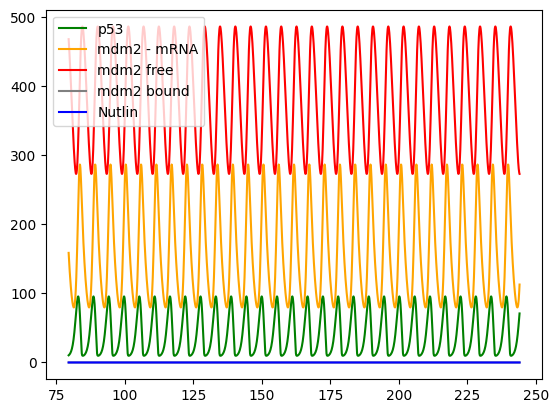

In [217]:
plt.plot(time_transient[1000:3000], p_transient[1000:3000], color="green", label="p53")
plt.plot(time_transient[1000:3000], m_transient[1000:3000], color="orange", label="mdm2 - mRNA")
plt.plot(time_transient[1000:3000], Mf_transient[1000:3000], color="red", label="mdm2 free")
plt.plot(time_transient[1000:3000], Mb_transient[1000:3000], color="gray", label="mdm2 bound")
plt.plot(time_transient[1000:3000], n_transient[1000:3000], color="blue", label="Nutlin")


plt.legend()
plt.plot()

# Peakfinding på transient

"For several conditions the interval borders can be specified with arrays matching x in shape which enables dynamic constrains based on the sample position."

In [218]:
# Compute stats for p53 transient to find period and amplitude for nutlin simulation
def compute_external_oscillator(t, y): #mean, amplitude, period
    y_peaks = find_peaks(y)[0]
    y_troughs = find_peaks(-y)[0]

    # Only keep peaks after the 10 first peaks. We assume that the period and amplitude will be approx. stable after this.
    stable_peaks = None
    stable_troughs = None
    if len(y_peaks) > 12 and len(y_peaks) > len(y_troughs):
        stable_peaks = y_peaks[10:-2]
        stable_troughs = y_troughs[10:-1]
    else:
        stable_peaks = y_peaks[10:-1]
        stable_troughs = y_troughs[10:-1]
        
    # Is it true that N is larger when using troughs also? So that the uncertainty is smaller?
    period = np.mean((np.diff(t[stable_peaks]) + np.diff(t[stable_troughs]))/2)
    # TODO: Calculate uncertainty for this!
    
    amplitude = np.mean((y[stable_peaks] - y[stable_troughs])/2)

    mean_value = np.mean(np.concatenate((y[stable_peaks] - amplitude, y[stable_troughs] + amplitude)))

    return period, amplitude, mean_value, stable_peaks, stable_troughs

In [219]:
T_int, A_int, mean_int, stable_peaks_int, stable_troughs_int = compute_external_oscillator(time_transient, p_transient)

In [220]:
T_int, A_int

(5.584143607694432, 42.984672942191)

Text(0.5, 1.0, 'Oscillationer af p53 koncentration med perioden T = 5.584 [hr?]')

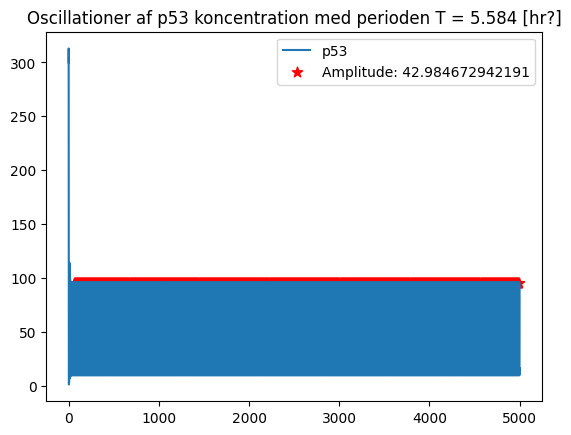

In [221]:
plt.plot(time_transient, p_transient, label="p53")
plt.scatter(time_transient[stable_peaks_int], p_transient[stable_peaks_int], s=60, c="red", marker='*', label=f"Amplitude: {A_int}")

plt.legend()

plt.title(f"Oscillationer af p53 koncentration med perioden T = {T_int:.4} [hr?]")

# Simulér med nutlin

In [222]:
def sim_onoff_nutlin(oscillationer, T_int, p0, m0, Mf0, Mb0, A_ext, OOmega = None, T_ext = None):
    if (not T_ext and OOmega):
        T_ext = OOmega * T_int
    if (not OOmega and T_ext):
        OOmega = T_ext / T_int
    
    # print(T_ext, T_int, OOmega)
    # print(A_ext)

    history = {"t":[] ,"p": [], "m": [], "Mf": [], "Mb":[], "n":[]}

    for i in range(oscillationer * 2):
        if i == 0:
            state = p0, m0, Mf0, Mb0, A_ext
            sys = solve_ivp(samlet_system, (0, T_ext/2), state, method='LSODA', max_step=0.5, dense_output=True)
            t, p, m, Mf, Mb, n = np.array(sys["t"]), sys["y"][0], sys["y"][1], sys["y"][2], sys["y"][3], sys["y"][4]
            history["t"].extend(t)
            history["p"].extend(p)
            history["m"].extend(m)
            history["Mf"].extend(Mf)
            history["Mb"].extend(Mb)
            history["n"].extend(n)
        
        # Every half period, nutlin is set to zero
        state = history["p"][-1], history["m"][-1], history["Mf"][-1], history["Mb"][-1], 0

        if (i != 0 and i % 2 == 0):
            # Every period, Nutlin concentration is reset to A_ext
            state = history["p"][-1], history["m"][-1], history["Mf"][-1], history["Mb"][-1], A_ext

        sys = solve_ivp(samlet_system, (0, T_ext/2), state, method='LSODA', max_step=0.5, dense_output=True)
        t, p, m, Mf, Mb, n = np.array(sys["t"]), sys["y"][0], sys["y"][1], sys["y"][2], sys["y"][3], sys["y"][4]
        history["t"].extend(t + history["t"][-1])
        history["p"].extend(p)
        history["m"].extend(m)
        history["Mf"].extend(Mf)
        history["Mb"].extend(Mb)
        history["n"].extend(n)
    
    return history, T_ext, OOmega

In [223]:
print(p_transient[-1], m_transient[-1], Mf_transient[-1], Mb_transient[-1])

16.379000854454922 103.8431997638555 394.6021225020922 1e-323


In [233]:
nutlin_pulse_ratio = 330 / 150

nultin_chaos_period = T_int / nutlin_pulse_ratio
nutlin_chaos_amplitude = 500 / kc1 
nutlin_chaos_amplitude

1.6666666666666667

In [235]:
nultin_chaos_period

2.5382470944065596

In [225]:
# omega = 1.14 and coupling = 2 halts everytime. What happens there?
current_omega = 4.563
coupling_strength = 1.687
Nutlin_A = A_int*coupling_strength

In [226]:
x0 = (p_transient[-1], m_transient[-1], Mf_transient[-1], Mb_transient[-1])

In [236]:
nutlin_sim, T_ext_sim, Omega_sim = sim_onoff_nutlin(200, T_int, *x0, Nutlin_A, OOmega=current_omega, T_ext = None)

In [228]:
t, p, m, Mb, Mf, n = np.array(nutlin_sim["t"]), np.array(nutlin_sim["p"]), np.array(nutlin_sim["m"]), np.array(nutlin_sim["Mb"]), np.array(nutlin_sim["Mf"]), np.array(nutlin_sim["n"])

[]

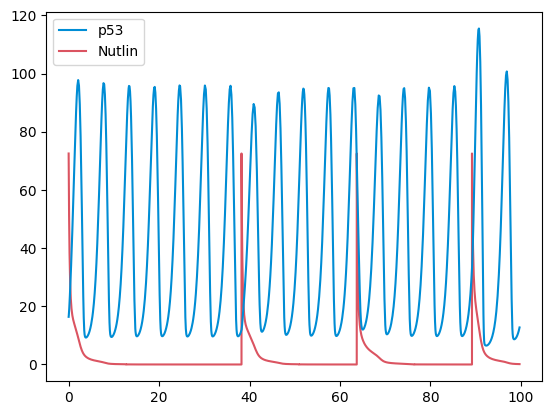

In [243]:
window_left = 0
window_right = 1000


plt.plot(t[window_left:window_right], p[window_left:window_right], color="#008DD5", zorder=10, alpha=1, label="p53")
plt.plot(t[window_left:window_right], n[window_left:window_right], color="#DB5461", alpha=1, label="Nutlin")
# plt.plot(time_transient[1000:3000], m_transient[1000:3000], color="orange", label="mdm2 - mRNA")
# plt.plot(time_transient[1000:3000], Mf_transient[1000:3000], color="red", label="mdm2 free")
# plt.plot(time_transient[1000:3000], Mb_transient[1000:3000], color="gray", label="mdm2 bound")


plt.legend()
plt.plot()

Text(0.5, 0.92, 'Simulating the p53 network')

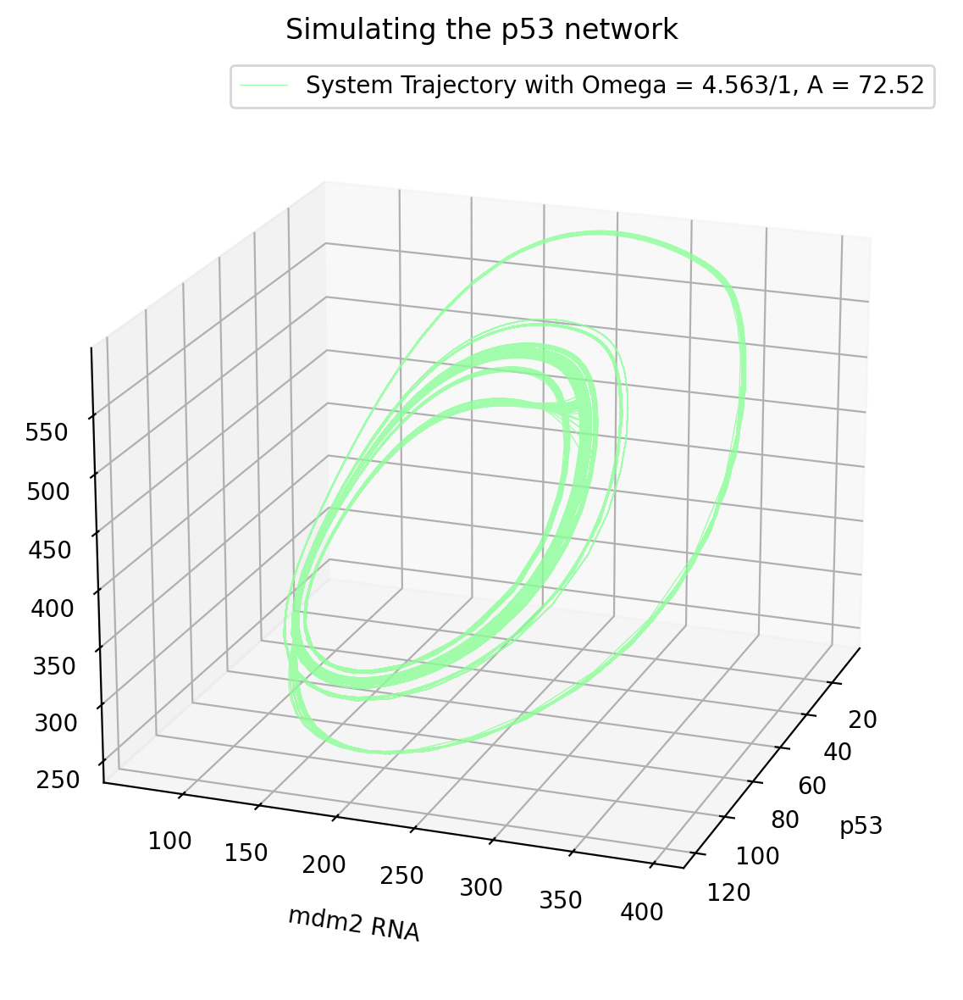

In [238]:
fig = plt.figure(figsize=(6, 6), dpi=200)
ax_3d = fig.add_subplot(111, projection='3d')  # Correct index for 3D plot
ax_3d.plot(p[1000:], m[1000:], Mf[1000:], color="#8CFF98", alpha=0.8, lw=0.5, label=f'System Trajectory with Omega = {Omega_sim}/1, A = {Nutlin_A:.4}')
ax_3d.set_xlabel(r'p53', labelpad=10)
ax_3d.set_ylabel('mdm2 RNA', labelpad=10)
# Adjust the z-label position
ax_3d.set_zlabel('Mf', labelpad=10)  # Adjust labelpad as needed

# Adjusting the view angle
ax_3d.view_init(elev=20, azim=20)  # Adjust elevation and azimuth to improve visibility

ax_3d.set_title(f'3D Phase Space')
ax_3d.legend()


plt.tight_layout()
plt.title("Simulating the p53 network")

In [94]:
coupling_min = 2.5
coupling_max = 3
stepsize = 30
Amp_arr = np.linspace(coupling_min, coupling_max, stepsize) * A_int
# why does the amplitude og NFKB keep changing?
def multi_amplitude_plot(stepsize):

    all_sims = []

    for i in tqdm(range(stepsize)):
        # print("Simulation nr.: ", i)
        nutlin_sim, T_ext_sim, Omega_sim = sim_onoff_nutlin(200, T_int, *x0, Amp_arr[i], OOmega= current_omega, T_ext = None)
        t, p, m, Mb, Mf, n = np.array(nutlin_sim["t"]), np.array(nutlin_sim["p"]), np.array(nutlin_sim["m"]), np.array(nutlin_sim["Mb"]), np.array(nutlin_sim["Mf"]), np.array(nutlin_sim["n"])
        all_sims.append([t, p, m, Mb, Mf, n, T_ext_sim, Omega_sim])
    
    return all_sims

In [95]:
sims = multi_amplitude_plot(stepsize)


  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 30/30 [00:17<00:00,  1.75it/s]


In [ ]:

all_t = [sim[0] for sim in sims]
all_p = [sim[1] for sim in sims]
all_m = [sim[2] for sim in sims]
all_Mb = [sim[3] for sim in sims]
all_Mf = [sim[4] for sim in sims]
all_n = [sim[5] for sim in sims]
all_T_ext = [sim[6] for sim in sims]
all_Omega = [sim[7] for sim in sims]


In [ ]:
figure, axis = plt.subplots(stepsize, figsize=[10,stepsize*5])

for i in tqdm(range(stepsize)):
        axis[i].plot(all_t[i], all_p[i], color="#0ECF82", zorder=10, lw=0.5, label = f'p53')
        axis[i].plot(all_t[i], all_n[i], alpha=1, color="#1ABCFE", lw=0.5, label = f'Nutlin with T = {all_T_ext[i]:.4}')
        axis[i].set_title(f"Hunt for chaos. Omega = {all_Omega[i]:.4}, A = {Amp_arr[i]:.4}")
        axis[i].legend();  
for ax in axis.flat:
    ax.set(xlabel='time [min.]', ylabel='concentration')
for ax in axis.flat:
    ax.label_outer()

    plt.tight_layout()

___

/var/folders/k7/f1crpym10dq1jlwf0j2n3h080000gn/T/ipykernel_61843/92477822.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(6, 6), dpi=100)


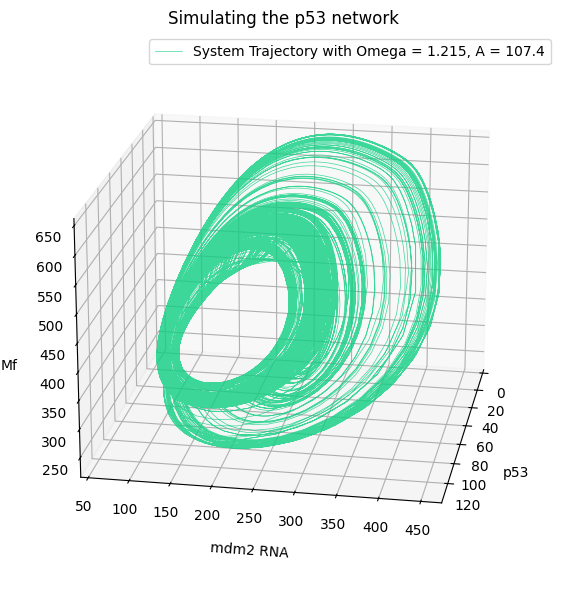

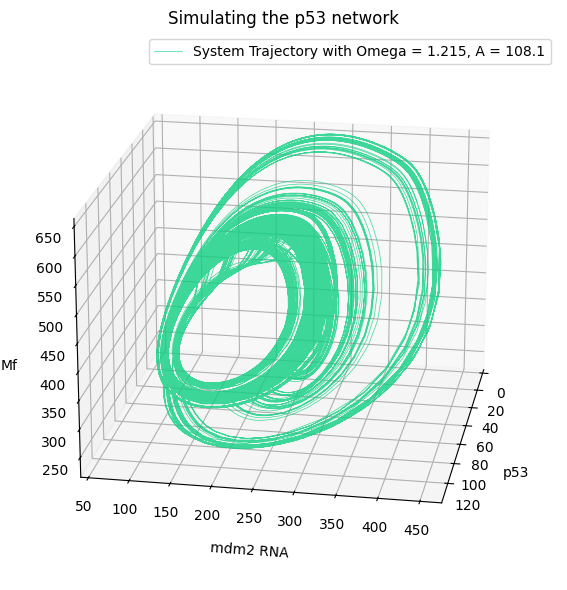

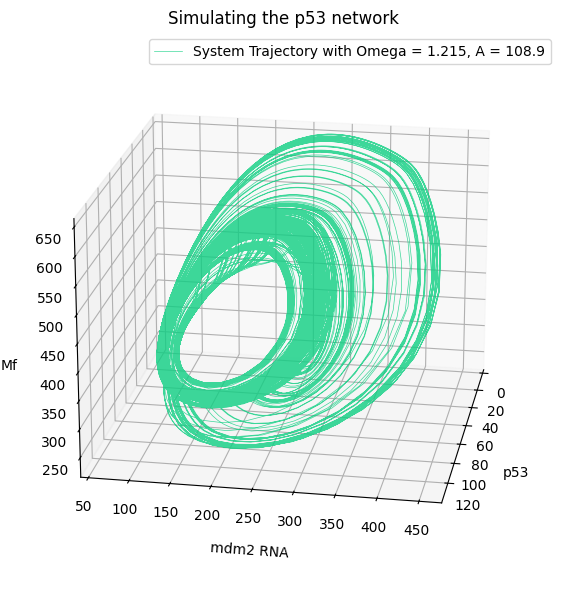

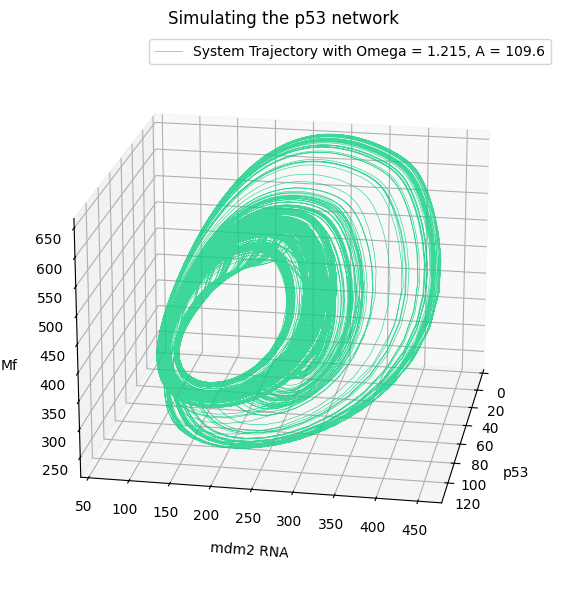

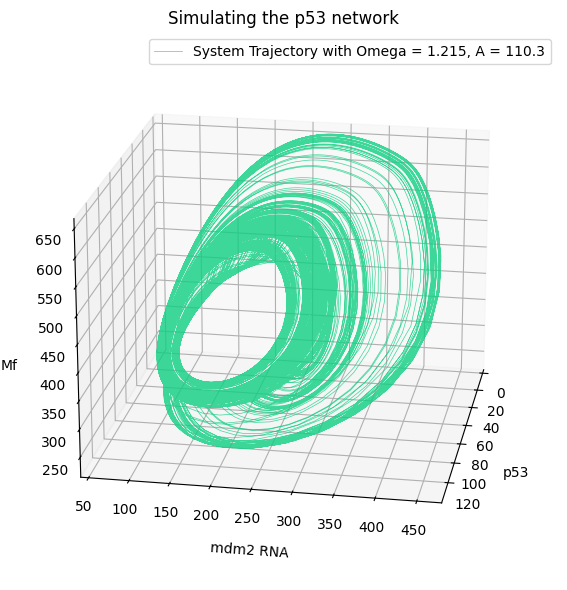

...

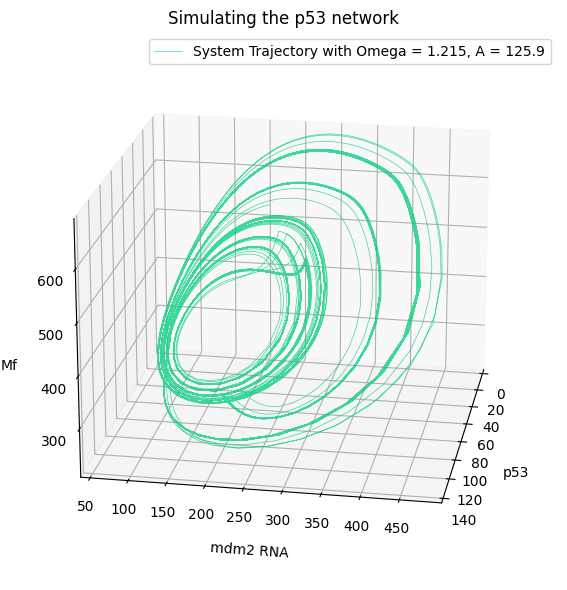

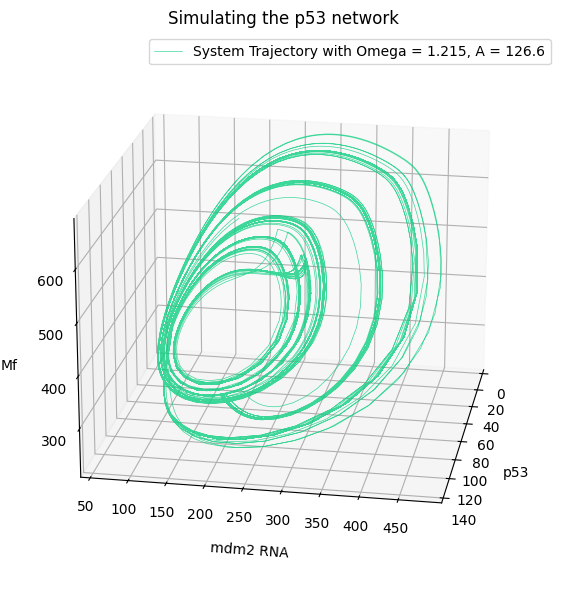

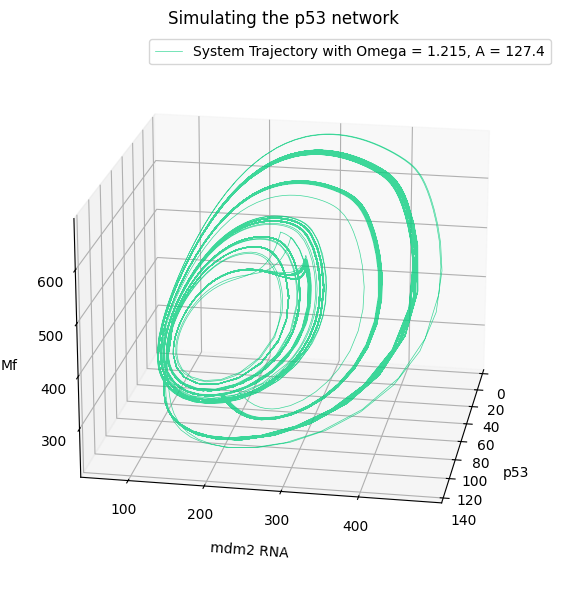

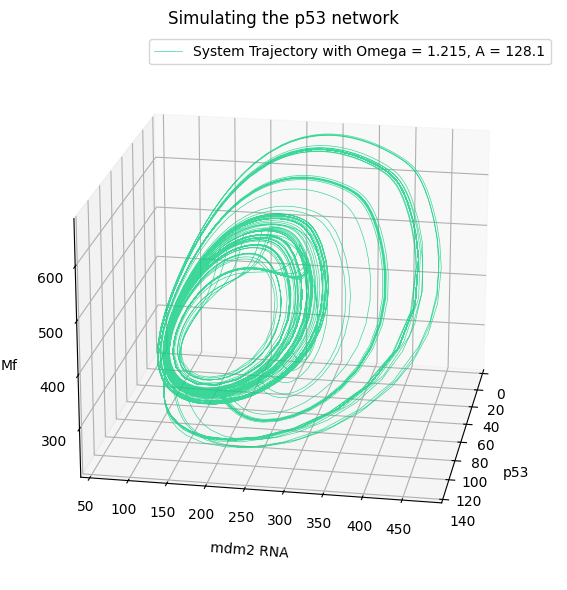

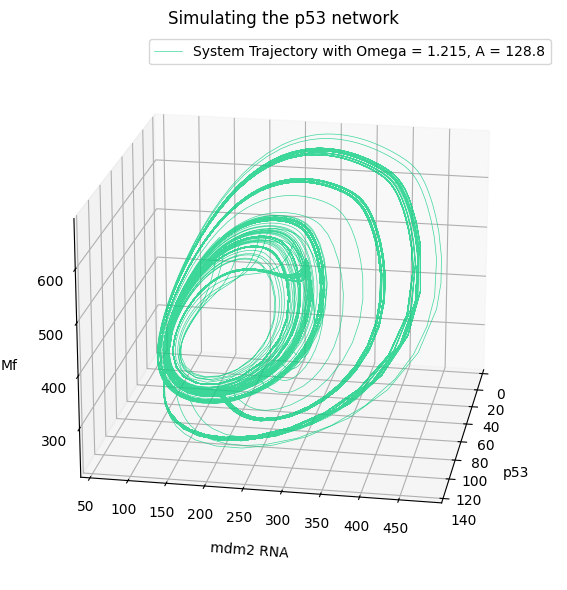

In [98]:
for i in range(stepsize):
    fig = plt.figure(figsize=(6, 6), dpi=100)
    ax_3d = fig.add_subplot(111, projection='3d')  # Correct index for 3D plot
    ax_3d.plot(all_p[i][800:], all_m[i][800:], all_Mf[i][800:], color="#0ECF82", alpha=0.8, lw=0.5, label=f'System Trajectory with Omega = {all_Omega[i]:.4}, A = {Amp_arr[i]:.4}')
    ax_3d.set_xlabel(r'p53', labelpad=10)
    ax_3d.set_ylabel('mdm2 RNA', labelpad=10)
    # Adjust the z-label position
    ax_3d.set_zlabel('Mf', labelpad=10)  # Adjust labelpad as needed

    # Adjusting the view angle
    ax_3d.view_init(elev=20, azim=10)  # Adjust elevation and azimuth to improve visibility

    ax_3d.set_title(f'3D Phase Space')
    ax_3d.legend()


    plt.tight_layout()
    plt.title("Simulating the p53 network")

In [168]:
coupling_const = 2.2
omega_min = 1
omega_max = 1.5
stepsize = 30
omega_array = np.linspace(omega_min, omega_max, stepsize)
# why does the amplitude og NFKB keep changing?
def multi_omega_plot(stepsize):

    all_sims = []

    for i in tqdm(range(stepsize)):
        # print("Simulation nr.: ", i)
        nutlin_sim, T_ext_sim, Omega_sim = sim_onoff_nutlin(200, T_int, *x0, coupling_const * A_int, OOmega = omega_array[i], T_ext = None)
        t, p, m, Mb, Mf, n = np.array(nutlin_sim["t"]), np.array(nutlin_sim["p"]), np.array(nutlin_sim["m"]), np.array(nutlin_sim["Mb"]), np.array(nutlin_sim["Mf"]), np.array(nutlin_sim["n"])
        all_sims.append([t, p, m, Mb, Mf, n, T_ext_sim, Omega_sim])
    
    return all_sims

In [169]:
sims = multi_omega_plot(stepsize)


100%|██████████| 30/30 [00:17<00:00,  1.67it/s]


In [170]:
all_t = [sim[0] for sim in sims]
all_p = [sim[1] for sim in sims]
all_m = [sim[2] for sim in sims]
all_Mb = [sim[3] for sim in sims]
all_Mf = [sim[4] for sim in sims]
all_n = [sim[5] for sim in sims]
all_T_ext = [sim[6] for sim in sims]
all_Omega = [sim[7] for sim in sims]


100%|██████████| 30/30 [00:00<00:00, 167.49it/s]


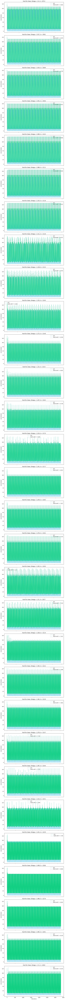

In [171]:
figure, axis = plt.subplots(stepsize, figsize=[10,stepsize*5])

for i in tqdm(range(stepsize)):
        axis[i].plot(all_t[i], all_p[i], color="#0ECF82", zorder=10, lw=0.5, label = f'p53')
        axis[i].plot(all_t[i], all_n[i], alpha=1, color="#1ABCFE", lw=0.5, label = f'Nutlin with T = {all_T_ext[i]:.4}')
        axis[i].set_title(f"Hunt for chaos. Omega = {all_Omega[i]:.4}, A = {Amp_arr[i]:.4}")
        axis[i].legend();  
for ax in axis.flat:
    ax.set(xlabel='time [min.]', ylabel='concentration')
for ax in axis.flat:
    ax.label_outer()

    plt.tight_layout()

/var/folders/k7/f1crpym10dq1jlwf0j2n3h080000gn/T/ipykernel_61843/92477822.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(6, 6), dpi=100)


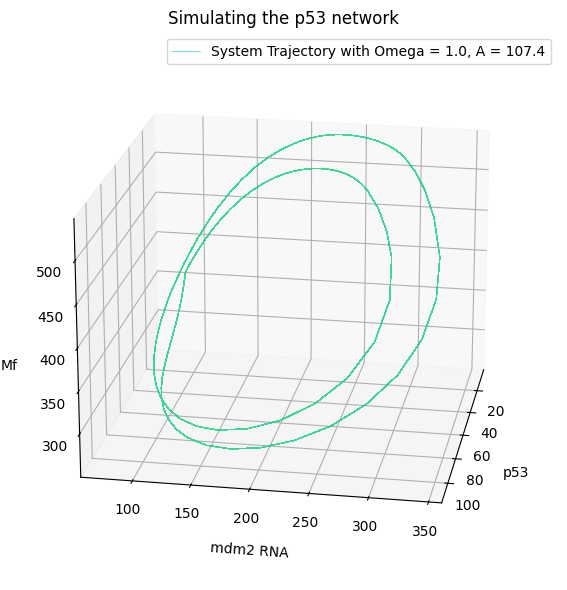

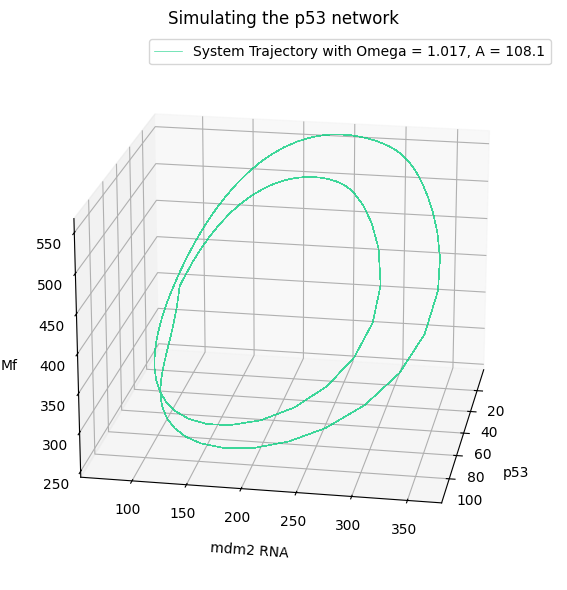

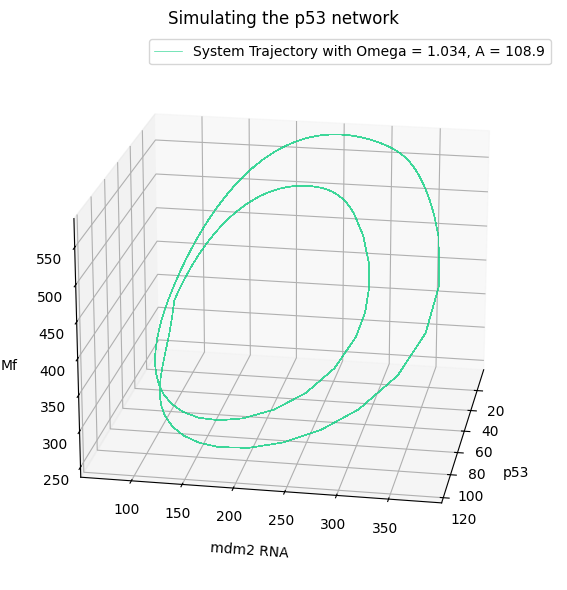

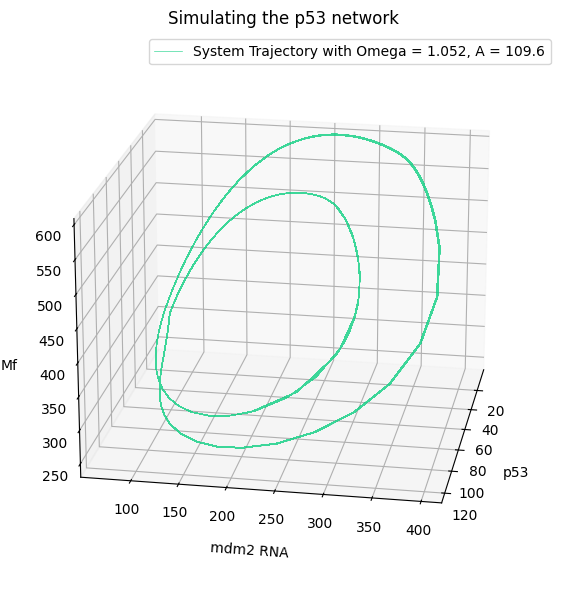

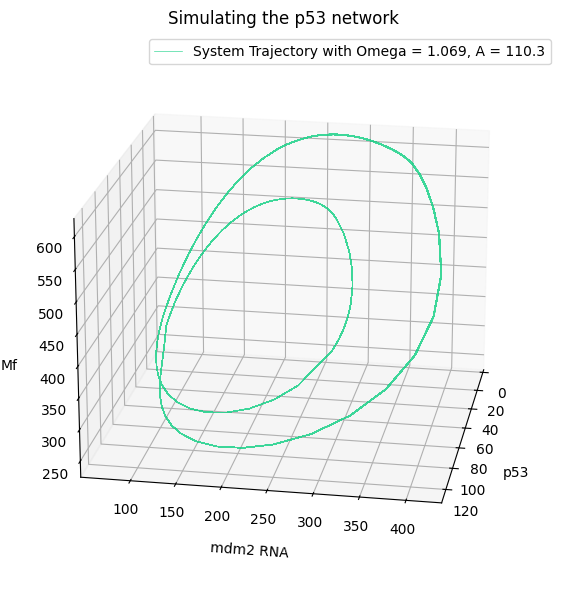

...

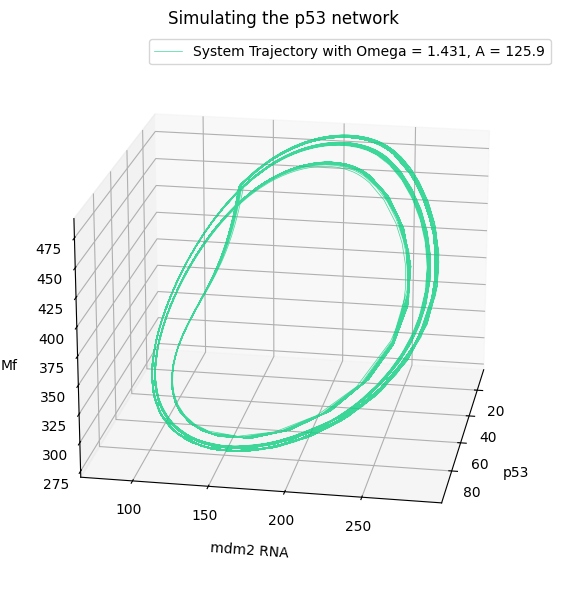

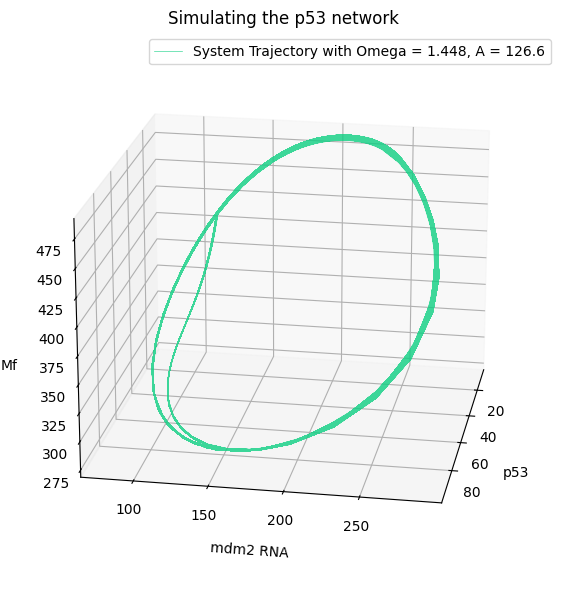

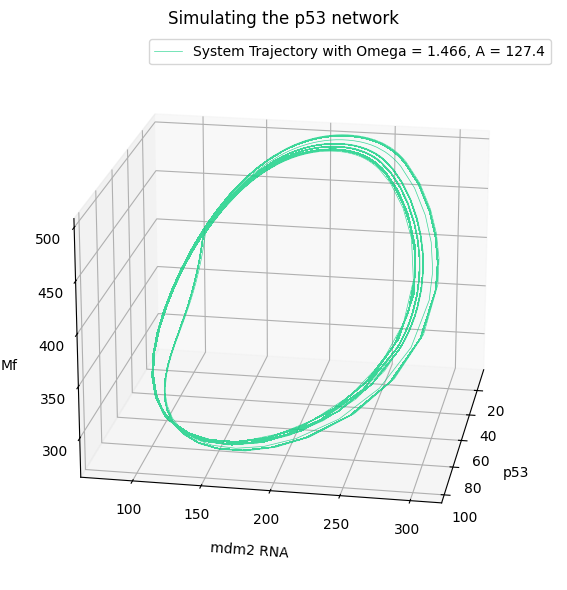

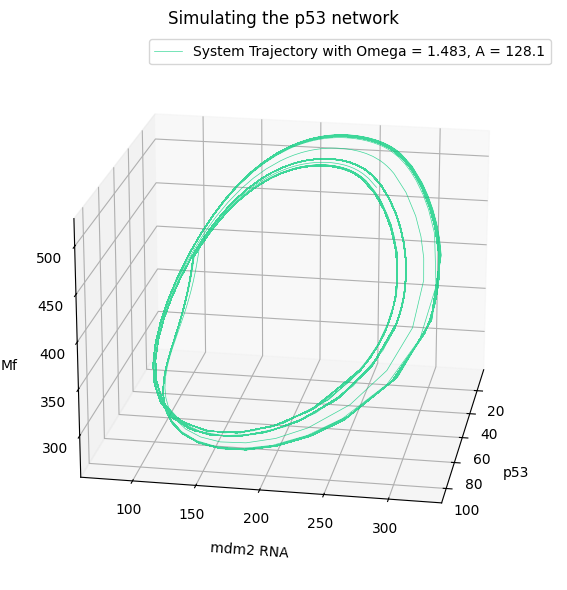

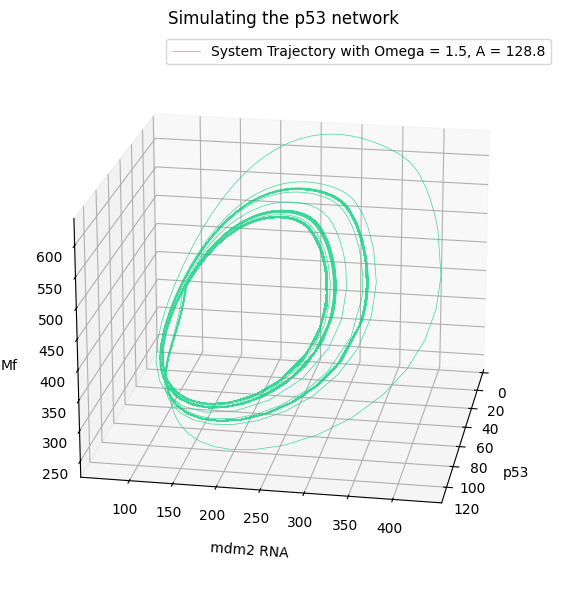

In [172]:
for i in range(stepsize):
    fig = plt.figure(figsize=(6, 6), dpi=100)
    ax_3d = fig.add_subplot(111, projection='3d')  # Correct index for 3D plot
    ax_3d.plot(all_p[i][800:], all_m[i][800:], all_Mf[i][800:], color="#0ECF82", alpha=0.8, lw=0.5, label=f'System Trajectory with Omega = {all_Omega[i]:.4}, A = {Amp_arr[i]:.4}')
    ax_3d.set_xlabel(r'p53', labelpad=10)
    ax_3d.set_ylabel('mdm2 RNA', labelpad=10)
    # Adjust the z-label position
    ax_3d.set_zlabel('Mf', labelpad=10)  # Adjust labelpad as needed

    # Adjusting the view angle
    ax_3d.view_init(elev=20, azim=10)  # Adjust elevation and azimuth to improve visibility

    ax_3d.set_title(f'3D Phase Space')
    ax_3d.legend()


    plt.tight_layout()
    plt.title("Simulating the p53 network")